In [3]:
!pip install ultralytics
from ultralytics import YOLO
model = YOLO("yolo11n.pt")

TRAIN Data Analysis is in process...



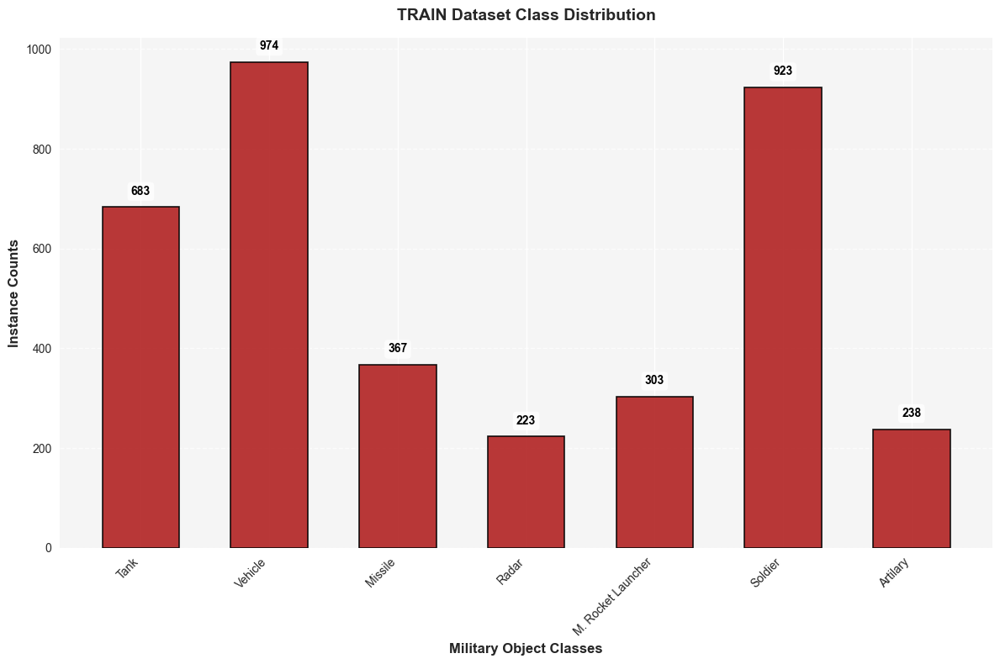

VALID Data Analysis is in process...



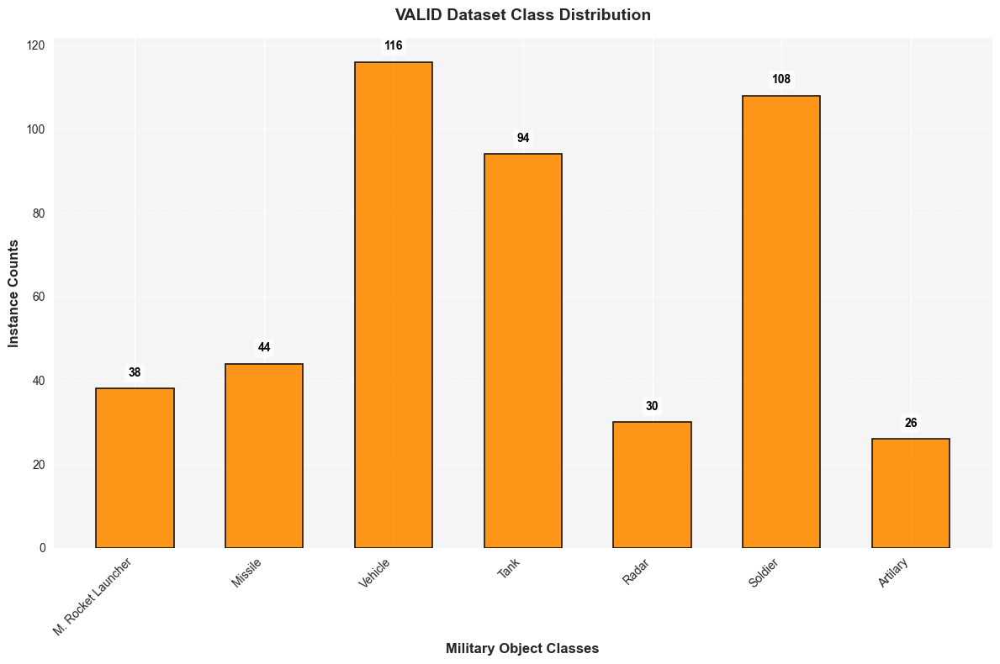

TEST Data Analysis is in process...



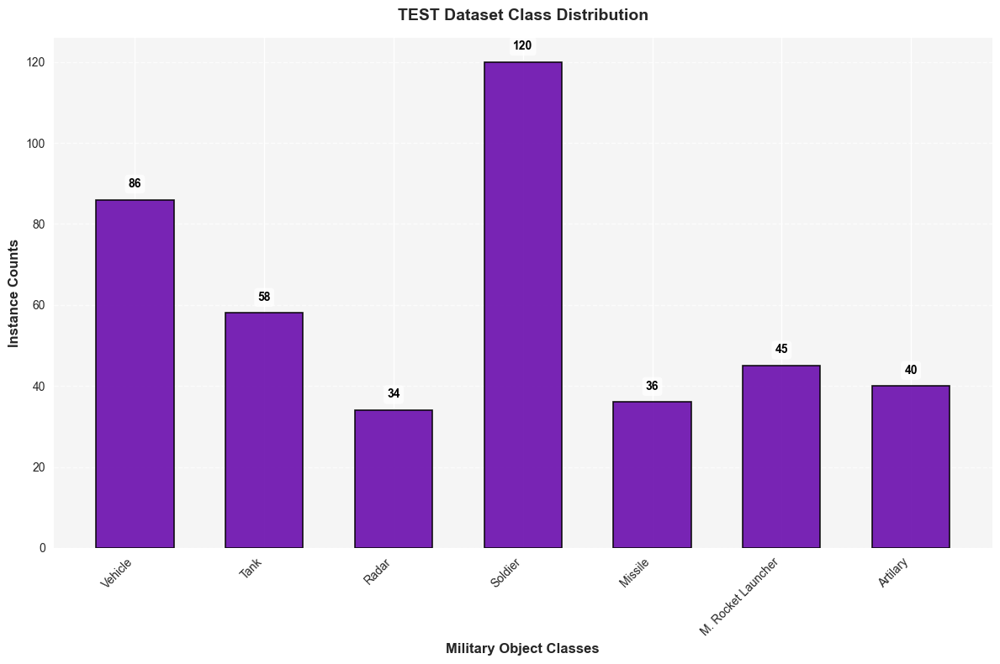

In [36]:
import os, cv2, yaml, random, numpy as np
from PIL import Image
from glob import glob
from matplotlib import pyplot as plt
from torchvision import transforms as T

class Visualization:
    def __init__(self, root, data_types, n_ims, rows, cmap=None):
        self.n_ims, self.rows = n_ims, rows
        self.cmap, self.data_types = cmap, data_types
        self.colors = ["#B22222", "#FF8C00", "#6A0DAD"]  # Firebrick, darkorange, blueviolet (hex for consistency)
        
        self.get_cls_names()
        self.get_bboxes()
                
    def get_cls_names(self):
        with open(f"{root}/KIIT-MiTA.yml", 'r') as file:
            data = yaml.safe_load(file)      
        class_names = data['names']        
        self.class_dict = {index: name for index, name in enumerate(class_names)}        
    
    def get_bboxes(self):
        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}
        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            im_paths = glob(f"{root}/{data_type}/images/*")            
            for idx, im_path in enumerate(im_paths):              
                bboxes = []
                im_ext = os.path.splitext(im_path)[-1]
                lbl_path = im_path.replace(im_ext, ".txt")
                lbl_path = lbl_path.replace(f"{data_type}/images/", f"{data_type}/labels/")
                if not os.path.isfile(lbl_path):
                    continue                
                meta_data = open(lbl_path).readlines()
                for data in meta_data:                    
                    parts = data.strip().split()[:5]
                    cls_name = self.class_dict[int(parts[0])]
                    bboxes.append([cls_name] + [float(x) for x in parts[1:]])
                    if cls_name not in all_analysis_datas:
                        all_analysis_datas[cls_name] = 1
                    else:
                        all_analysis_datas[cls_name] += 1
                all_bboxes.append(bboxes)
            self.vis_datas[data_type] = all_bboxes
            self.analysis_datas[data_type] = all_analysis_datas
            self.im_paths[data_type] = im_paths
    
    def plot(self, rows, cols, count, im_path, bboxes):
        plt.subplot(rows, cols, count)
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape
        for bbox in bboxes:
            class_id, x_center, y_center, w, h = bbox
            x_min = int((x_center - w / 2) * width) 
            y_min = int((y_center - h / 2) * height)  
            x_max = int((x_center + w / 2) * width)  
            y_max = int((y_center + w / 2) * height) 
            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(img=or_im, pt1=(x_min, y_min), pt2=(x_max, y_max), color=color, thickness=3)
        plt.imshow(or_im)
        plt.axis("off")
        plt.title(f"There is (are) {len(bboxes)} object(s) in the image.")
        return count + 1

    def vis(self, save_name):
        print(f"{save_name.upper()} Data Visualization is in process...\n")
        assert self.cmap in ["rgb", "gray"], "Please choose rgb or gray cmap"
        if self.cmap == "rgb":
            cmap = "viridis"
        cols = self.n_ims // self.rows
        count = 1
        plt.figure(figsize=(25, 20))
        indices = [random.randint(a=0, b=len(self.vis_datas[save_name]) - 1) for _ in range(self.n_ims)]
        for idx, index in enumerate(indices):
            if count == self.n_ims + 1:
                break
            im_path, bboxes = self.im_paths[save_name][index], self.vis_datas[save_name][index]
            count = self.plot(self.rows, cols, count, im_path=im_path, bboxes=bboxes)
        plt.show()

    def data_analysis(self, save_name, color):
        print(f"{save_name.upper()} Data Analysis is in process...\n")
        plt.style.use('seaborn-v0_8')  
        fig, ax = plt.subplots(figsize=(12, 8))  
        cls_names = list(self.analysis_datas[save_name].keys())
        counts = list(self.analysis_datas[save_name].values())
        indices = np.arange(len(counts))
        bar_width = 0.6  
        bars = ax.bar(indices, counts, bar_width, color=color, alpha=0.9, edgecolor='black', linewidth=1.2)
        ax.set_xlabel("Military Object Classes", fontsize=12, weight='bold')
        ax.set_ylabel("Instance Counts", fontsize=12, weight='bold')
        ax.set_title(f"{save_name.upper()} Dataset Class Distribution", fontsize=14, weight='bold', pad=15)
        ax.set_xticks(indices)
        ax.set_xticklabels(cls_names, rotation=45, ha='right', fontsize=10)
        ax.yaxis.grid(True, linestyle='--', alpha=0.7)
        ax.set_axisbelow(True)  
        for i, v in enumerate(counts):
            ax.text(i, v + max(counts)*0.02, str(v), ha='center', va='bottom', 
                    fontsize=10, color='black', weight='bold',
                    bbox=dict(facecolor='white', alpha=0.8, edgecolor='none', boxstyle='round,pad=0.3'))
        ax.set_facecolor('#F5F5F5')  
        fig.patch.set_facecolor('white')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_color('gray')
        ax.spines['bottom'].set_color('gray')
        
        plt.tight_layout()
        plt.show()

    def visualization(self):
        [self.vis(save_name) for save_name in self.data_types]
        
    def analysis(self):
        [self.data_analysis(save_name, color) for (save_name, color) in zip(self.data_types, self.colors)]

root = "/Users/harshith/Desktop/Object detection/KIIT-MiTA"
vis = Visualization(root=root, data_types=["train", "valid", "test"], n_ims=20, rows=5, cmap="rgb")
vis.analysis()

TRAIN Data Visualization is in process...



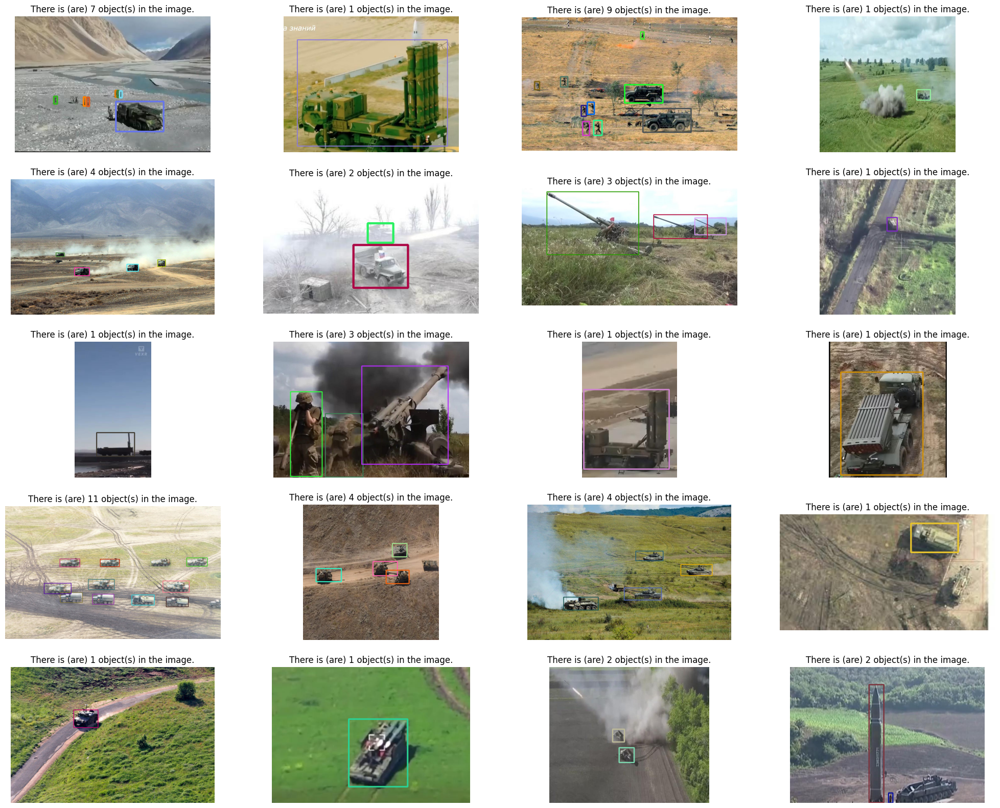

VALID Data Visualization is in process...



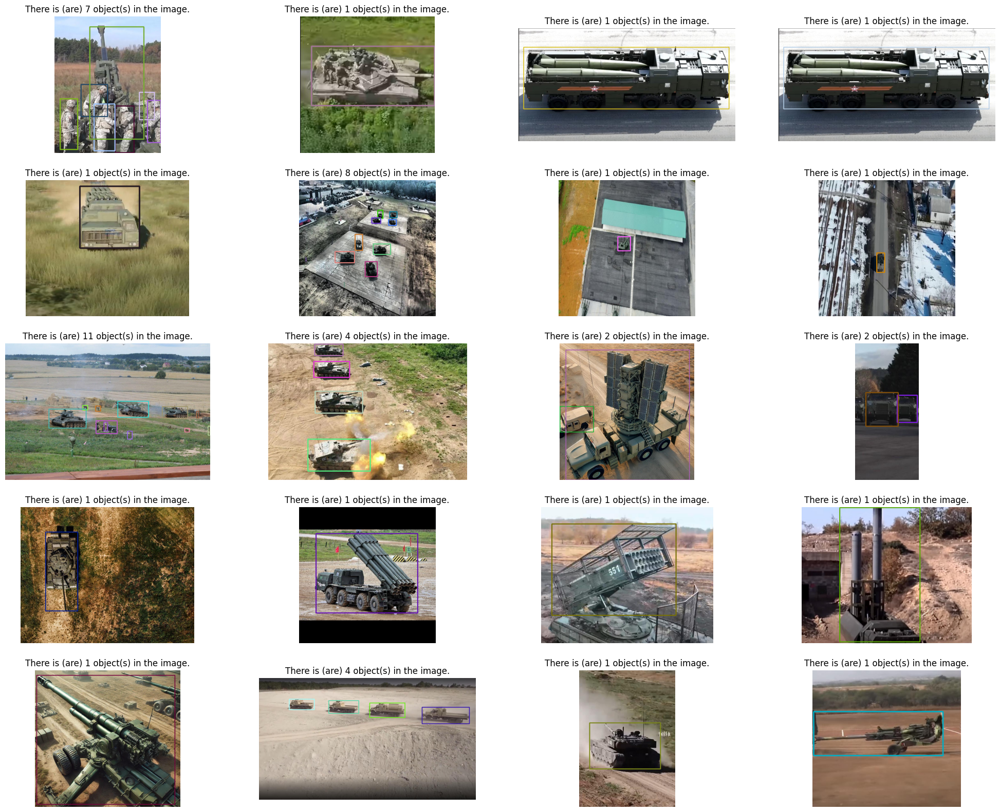

TEST Data Visualization is in process...



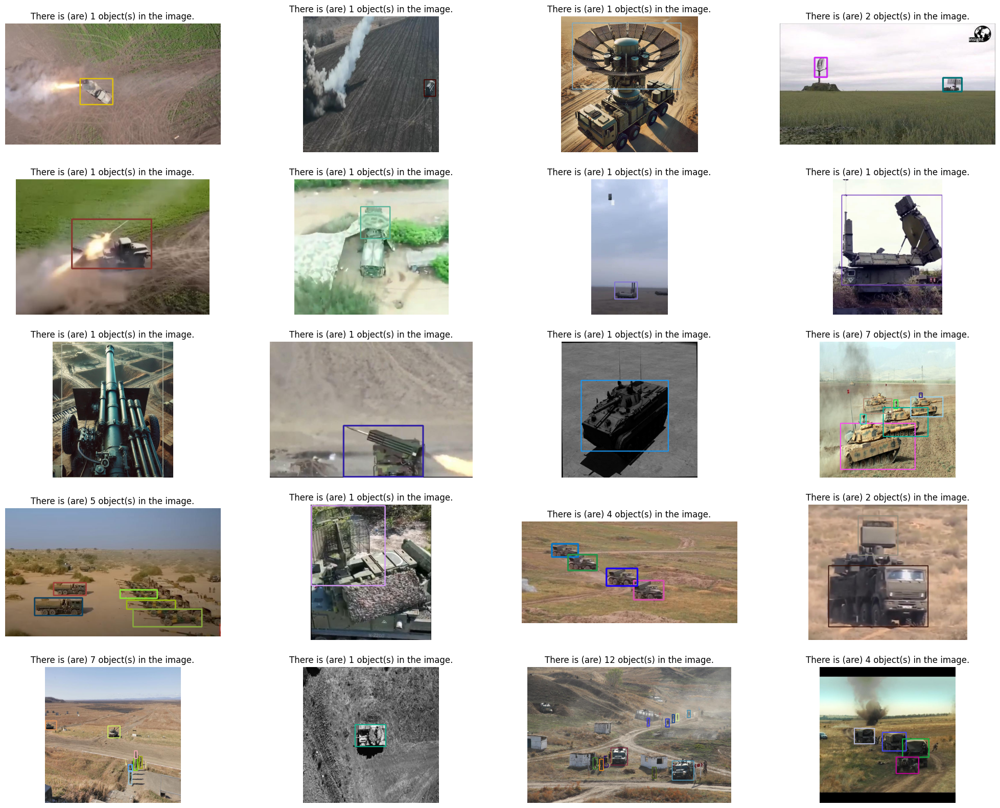

In [7]:
vis.visualization()

In [13]:
# Load YAML content into a Python dictionary
yml_file_path = f"{root}/KIIT-MiTA.yml"

with open(yml_file_path, 'r') as file:
    data = yaml.safe_load(file)
# Update the paths
data['train'] = '/Users/harshith/Desktop/Object detection/KIIT-MiTA/train/images'
data['val'] = '/Users/harshith/Desktop/Object detection/KIIT-MiTA/valid/images'
data['test'] = '/Users/harshith/Desktop/Object detection/KIIT-MiTA/test/images'

print(data)
# Save the updated YAML content to a file
output_path = '/Users/harshith/Desktop/Object detection/KIIT-MiTA/updated_config.yml'
with open(output_path, 'w') as file: yaml.dump(data, file, default_flow_style=False)

train_results = model.train(
    data="/Users/harshith/Desktop/Object detection/KIIT-MiTA/updated_config.yml",
    epochs=10,  # number of training epochs
    imgsz=480,  # training image size
    device="cpu"  # Use string "cpu"
)

{'names': ['Artilary', 'Missile', 'Radar', 'M. Rocket Launcher', 'Soldier', 'Tank', 'Vehicle'], 'nc': 7, 'train': '/Users/harshith/Desktop/Object detection/KIIT-MiTA/train/images', 'val': '/Users/harshith/Desktop/Object detection/KIIT-MiTA/valid/images', 'test': '/Users/harshith/Desktop/Object detection/KIIT-MiTA/test/images'}
New https://pypi.org/project/ultralytics/8.3.141 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.140 🚀 Python-3.13.1 torch-2.7.0 CPU (Apple M2)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/Users/harshith/Desktop/Object detection/KIIT-MiTA/updated_config.yml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=t

train: Scanning /Users/harshith/Desktop/Object detection/KIIT-MiTA/train/labels... 1360 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1360/1360 [00:00<00:00, 5056.82it/s]

train: New cache created: /Users/harshith/Desktop/Object detection/KIIT-MiTA/train/labels.cache
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 178.6±91.5 MB/s, size: 42.7 KB)



val: Scanning /Users/harshith/Desktop/Object detection/KIIT-MiTA/valid/labels... 170 images, 0 backgrounds, 0 corrupt: 100%|██████████| 170/170 [00:00<00:00, 4810.27it/s]

val: New cache created: /Users/harshith/Desktop/Object detection/KIIT-MiTA/valid/labels.cache


Plotting labels to /Users/harshith/runs/detect/train10/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 480 train, 480 val
Using 0 dataloader workers
Logging results to /Users/harshith/runs/detect/train10
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G      1.373       3.49      1.257         58        480: 100%|██████████| 85/85 [05:41<00:00,  4.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:12<00:00,  2.16s/it]

                   all        170        456      0.377      0.101      0.186      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10         0G      1.469      2.675      1.345         46        480: 100%|██████████| 85/85 [05:37<00:00,  3.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:13<00:00,  2.17s/it]

                   all        170        456       0.47        0.3      0.294      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      1.467      2.496      1.336         43        480: 100%|██████████| 85/85 [05:33<00:00,  3.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:12<00:00,  2.16s/it]

                   all        170        456      0.191      0.393      0.216      0.118

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       4/10         0G      1.451      2.349      1.318         56        480: 100%|██████████| 85/85 [05:44<00:00,  4.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:13<00:00,  2.29s/it]

                   all        170        456      0.308      0.394      0.266      0.141

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       5/10         0G      1.405      2.177      1.291         52        480: 100%|██████████| 85/85 [05:47<00:00,  4.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:13<00:00,  2.32s/it]

                   all        170        456      0.428      0.418      0.381      0.219

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       6/10         0G      1.332      2.026      1.245         42        480: 100%|██████████| 85/85 [05:50<00:00,  4.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:14<00:00,  2.38s/it]

                   all        170        456      0.527      0.427      0.452      0.261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       7/10         0G      1.282      1.895      1.216         40        480: 100%|██████████| 85/85 [05:59<00:00,  4.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:14<00:00,  2.43s/it]

                   all        170        456      0.561       0.44      0.483       0.29

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       8/10         0G      1.235      1.755      1.183         30        480: 100%|██████████| 85/85 [06:13<00:00,  4.39s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:15<00:00,  2.57s/it]

                   all        170        456      0.619      0.463      0.526      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



       9/10         0G      1.191      1.638      1.153         49        480: 100%|██████████| 85/85 [06:11<00:00,  4.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:14<00:00,  2.48s/it]

                   all        170        456      0.605      0.566      0.588      0.368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size



      10/10         0G      1.151      1.572       1.13         52        480: 100%|██████████| 85/85 [06:06<00:00,  4.31s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:14<00:00,  2.47s/it]

                   all        170        456      0.669      0.525      0.595       0.39

10 epochs completed in 1.019 hours.


Optimizer stripped from /Users/harshith/runs/detect/train10/weights/last.pt, 5.4MB
Optimizer stripped from /Users/harshith/runs/detect/train10/weights/best.pt, 5.4MB

Validating /Users/harshith/runs/detect/train10/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.13.1 torch-2.7.0 CPU (Apple M2)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:15<00:00,  2.56s/it]


                   all        170        456      0.669      0.525      0.595      0.389
              Artilary         19         26      0.756      0.478      0.577      0.364
               Missile         25         44      0.696      0.409      0.541      0.387
                 Radar         27         30      0.519      0.467      0.458       0.26
    M. Rocket Launcher         28         38      0.741      0.605      0.678      0.542
               Soldier         35        108      0.684       0.44       0.53      0.268
                  Tank         37         94      0.635      0.798      0.784      0.522
               Vehicle         47        116      0.655      0.475      0.598      0.382
Speed: 0.3ms preprocess, 83.0ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /Users/harshith/runs/detect/train10


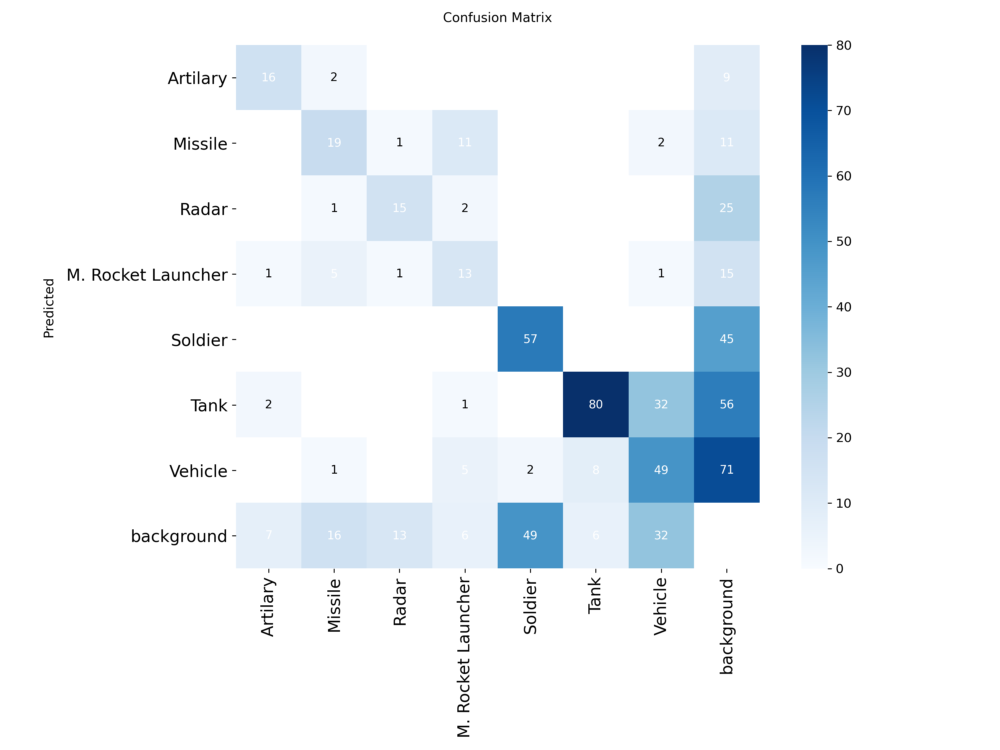

In [17]:
Image.open("/Users/harshith/runs/detect/train10/confusion_matrix.png")

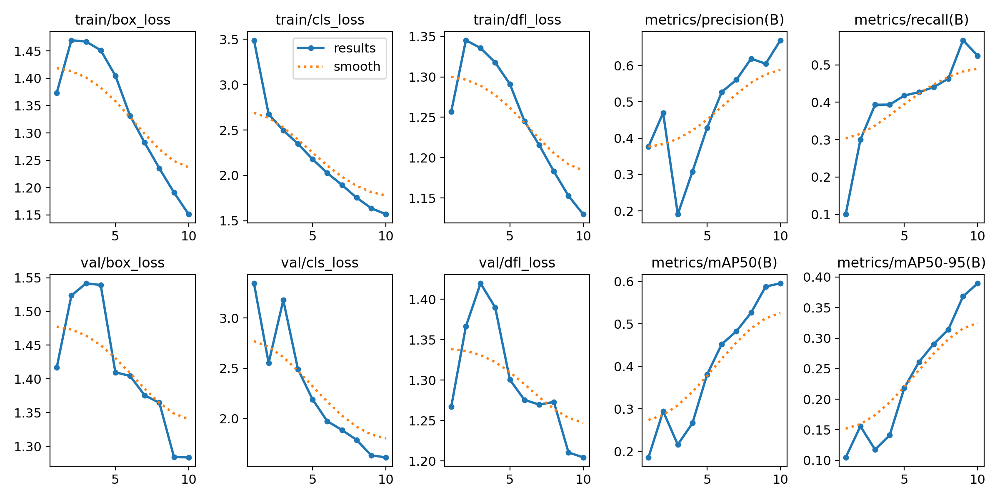

In [18]:
Image.open("/Users/harshith/runs/detect/train10/results.png")

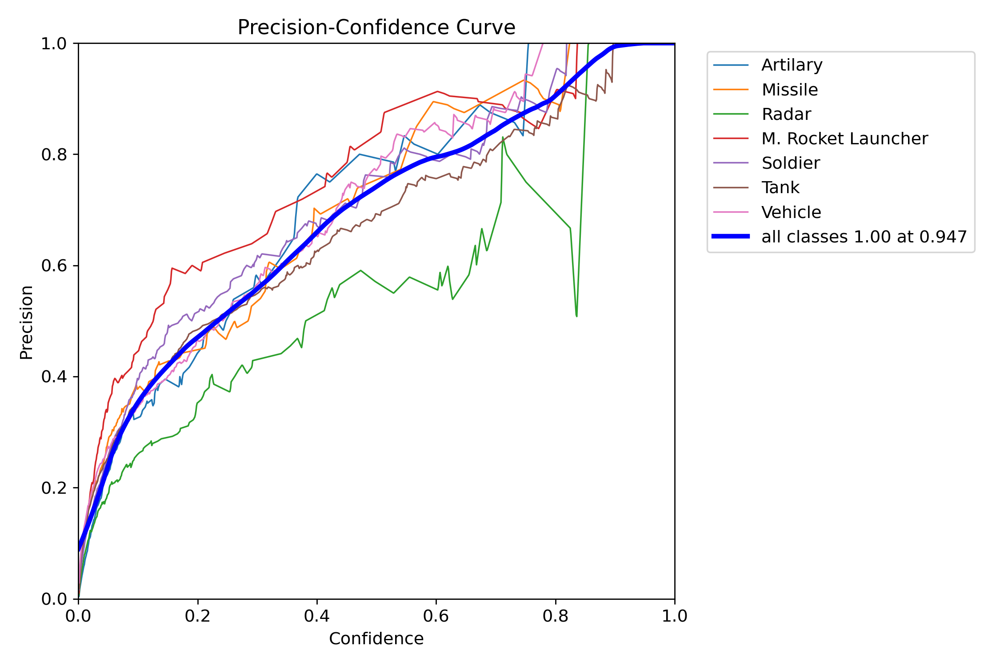

In [19]:
Image.open("/Users/harshith/runs/detect/train10//P_curve.png")

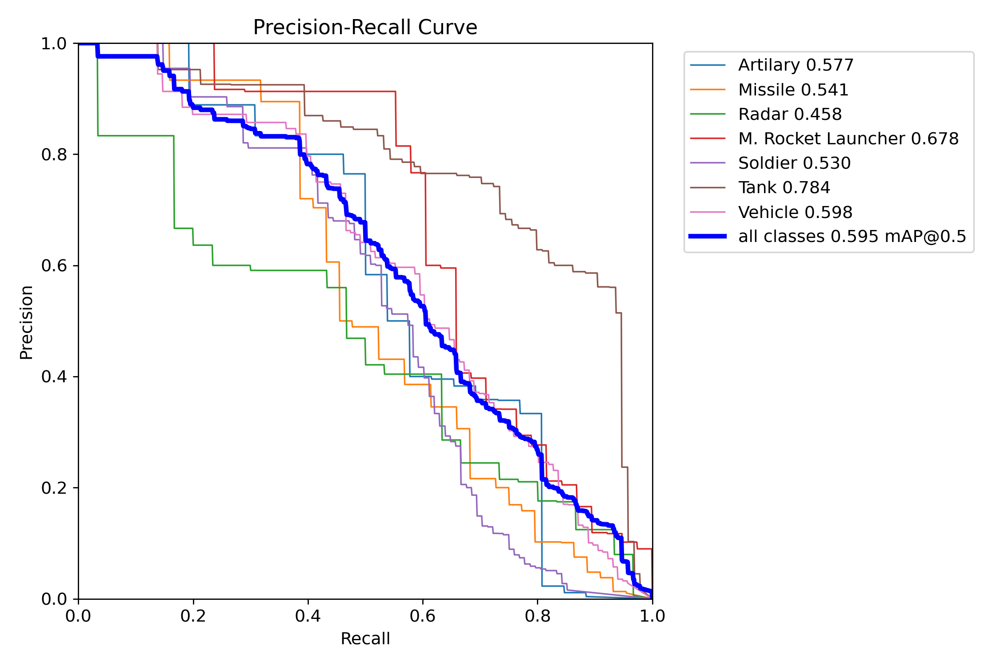

In [20]:
Image.open("/Users/harshith/runs/detect/train10/PR_curve.png")

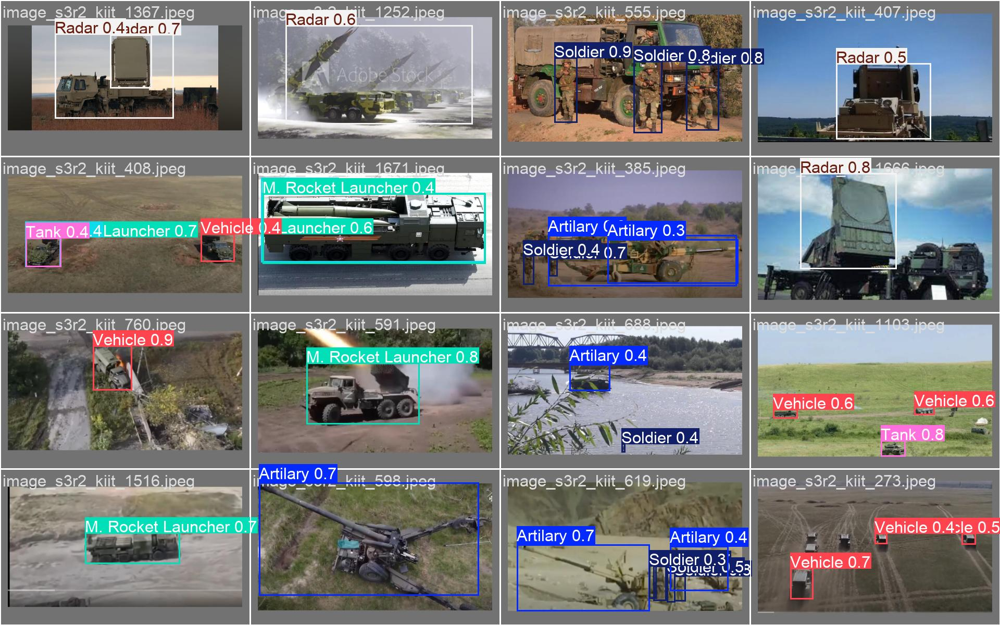

In [24]:
Image.open("/Users/harshith/runs/detect/train10/val_batch0_pred.jpg")

In [27]:
inference_results = model.predict(
    source="/Users/harshith/Desktop/Object detection/KIIT-MiTA/test/images",
    device="cpu",  
    verbose=False
)

Ultralytics 8.3.140 🚀 Python-3.13.1 torch-2.7.0 CPU (Apple M2)
YOLO11n summary (fused): 100 layers, 2,616,248 parameters, 0 gradients, 6.5 GFLOPs


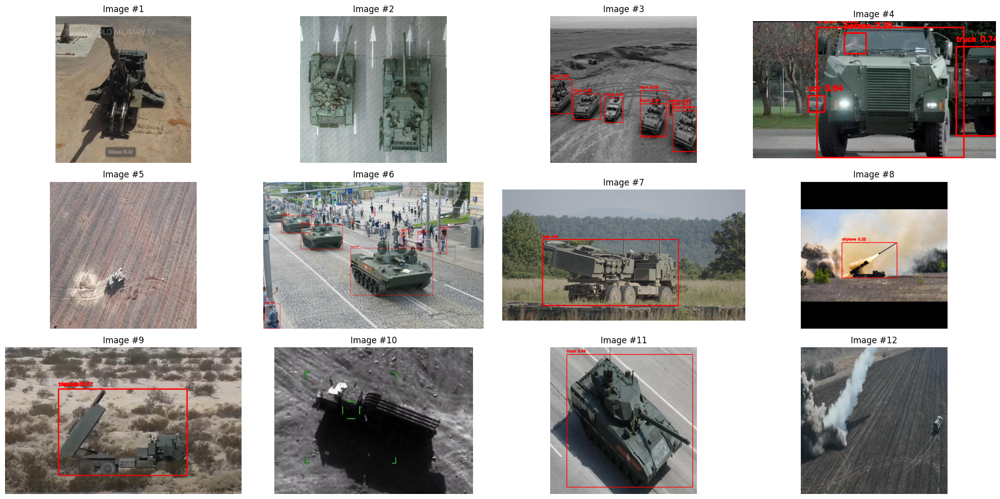

In [31]:
def inference_vis(res, n_ims, rows):
    cols = n_ims // rows
    plt.figure(figsize=(20, 10))
    for idx, r in enumerate(res):
        if idx >= n_ims:  
            break
        plt.subplot(rows, cols, idx + 1)
        or_im_rgb = np.array(Image.open(r.path).convert("RGB"))
        
        for box in r.boxes:  
            xyxy = box.xyxy[0].cpu().numpy()  
            x1, y1, x2, y2 = map(int, xyxy)
            conf = box.conf[0].cpu().numpy()  
            cls = int(box.cls[0].cpu().numpy())  
            label = f"{r.names[cls]} {conf:.2f}"  
            
            cv2.rectangle(or_im_rgb, (x1, y1), (x2, y2), color=(255, 0, 0), thickness=2)
            cv2.putText(
                or_im_rgb,
                label,
                (x1, y1 - 10),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.5,
                (255, 0, 0),
                2
            )
        
        plt.imshow(or_im_rgb)
        plt.title(f"Image #{idx + 1}")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

inference_vis(res=inference_results, n_ims=12, rows=3)

In [35]:
model = YOLO("/Users/harshith/runs/detect/train10/weights/best.pt")
val_results = model.val(
    data="/Users/harshith/Desktop/Object detection/KIIT-MiTA/updated_config.yml",
    split="test",
    imgsz=480,
    device="cpu",
    verbose=True
)
print("Test Dataset Evaluation Metrics:")
print(f"mAP@50: {val_results.box.map50:.4f}")
print(f"mAP@50:95: {val_results.box.map:.4f}")
print(f"Precision (mean): {np.mean(val_results.box.p):.4f}")
print(f"Recall (mean): {np.mean(val_results.box.r):.4f}")
print("\nPer-Class Metrics (mAP@50, Precision, Recall):")
for cls, map50, prec, rec in zip(val_results.names.values(), val_results.box.maps, val_results.box.p, val_results.box.r):
    print(f"{cls}: mAP@50={map50:.4f}, Precision={prec:.4f}, Recall={rec:.4f}")

Ultralytics 8.3.140 🚀 Python-3.13.1 torch-2.7.0 CPU (Apple M2)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 167.2±106.5 MB/s, size: 43.8 KB)


val: Scanning /Users/harshith/Desktop/Object detection/KIIT-MiTA/test/labels.cache... 170 images, 0 backgrounds, 0 corrupt: 100%|██████████| 170/170 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:14<00:00,  1.29s/it]


                   all        170        419      0.626      0.522      0.564      0.358
              Artilary         23         40      0.899      0.446      0.556      0.289
               Missile         23         36       0.57      0.405      0.516      0.366
                 Radar         31         34      0.417      0.441      0.462      0.263
    M. Rocket Launcher         25         45       0.71      0.533      0.621      0.491
               Soldier         36        120      0.558      0.542      0.532      0.271
                  Tank         34         58      0.525      0.741      0.601       0.38
               Vehicle         39         86      0.702      0.547      0.657      0.443
Speed: 0.4ms preprocess, 77.2ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /Users/harshith/runs/detect/val4
Test Dataset Evaluation Metrics:
mAP@50: 0.5636
mAP@50:95: 0.3576
Precision (mean): 0.6258
Recall (mean): 0.5222

Per-Class Metrics (mAP@50, Precision, Rec